# **Analyzing The World With World Development Indicators**

## Contents

1. [Unveiling Global Dynamics](#Unveiling-Global-Dynamics)
2. [Importing Libraries & Datasets](#Importing-Libraries-&-Datasets)
3. [Data Cleaning](#Data-Cleaning)
4. [Exploratory Data Analysis](#Exploratory-Data-Analysis)

## Unveiling Global Dynamics

This dataset from The World Bank on world development indicators is an interesting dataset with lots of features to choose from. This is an amazing dataset that could provide lots of high-level information on all countries in the world for the past few decades. This project aims to serve as a bird's-eye view of global trends across various aspects. We shall analyze the trends across the world based on selected features from the dataset and try to gain some insights. Then we shall build a streamlit based web application so that a users can gain various kinds of insights on the dynamics amongst numerous countries over a period of the last 30 years.


## Importing Libraries & Datasets

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import seaborn as sns
from scipy.interpolate import PchipInterpolator
import missingno as msno
import plotly.graph_objs as go
import plotly.express as px

In [2]:
# Loading all data files

def load_csv_files_to_dataframes(folder_path):
    dataframes = {}
    for filename in os.listdir(folder_path):
        if filename.endswith('.csv'):
            file_path = os.path.join(folder_path, filename)
            df_name = os.path.splitext(filename)[0]  # Remove the file extension to get the name
            df = pd.read_csv(file_path)
            dataframes[df_name] = df
    return dataframes
folder1_path = r'C:\Users\Admin\Desktop\Data_Science\E2E_Projects\Data_Analysis\New_dataset\New_data_files_Latest\Test'
# folder1_path = 'Replace this text with your folder path'     # Enter the path to the folder where all the csv files you downloaded are stored

# Loading files to dictionaries
dataframes_folder1 = load_csv_files_to_dataframes(folder1_path)

In [3]:
# We shall make a keylist that contains keynames. These keys open the dataframes stored in the dictionary

keylist1 = list(dataframes_folder1.keys())

In [4]:
# Viewing a sample dataframe:

dataframes_folder1[keylist1[0]].head(10)

,Country,1990,1991,1992,1993,1994,1995,1996,1997,1998,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
0,Afghanistan,142.960,147.525,147.521,147.896,155.669,156.770,154.932,156.444,154.262,...,111.286,106.537,101.454,97.415,94.018,90.342,88.431,86.803,84.296,82.565
1,Angola,198.803,197.301,196.400,195.398,195.291,193.237,192.841,187.510,182.742,...,156.557,153.345,151.093,148.074,146.135,145.235,142.575,141.278,139.825,138.402
2,Albania,14.815,14.784,16.155,17.855,20.157,21.869,21.756,20.149,18.001,...,20.909,20.865,20.942,20.276,18.171,16.585,15.580,15.013,14.672,14.517
3,Andorra,10.656,10.878,10.919,9.558,8.761,8.242,8.296,8.717,8.767,...,8.414,6.989,6.925,7.402,7.176,6.404,6.080,5.985,6.091,5.887
4,United Arab Emirates,48.493,41.065,39.971,38.536,41.638,35.147,34.231,29.477,26.185,...,11.149,9.876,8.819,7.785,7.035,5.593,4.275,3.825,3.077,3.085
5,Argentina,70.928,71.979,72.151,72.502,73.516,72.810,71.390,70.424,69.307,...,68.719,69.167,67.791,65.395,61.852,57.783,51.029,46.153,39.866,39.065
6,Armenia,73.201,78.736,86.553,85.981,82.148,69.251,62.587,54.180,48.124,...,29.083,25.412,27.222,24.660,24.621,21.379,19.533,19.041,18.571,18.511
7,Antigua and Barbuda,82.867,70.292,68.627,63.497,65.405,69.521,70.121,64.099,58.318,...,36.808,33.761,33.422,34.834,30.373,30.352,27.548,30.830,32.959,33.110
8,Australia,21.673,21.491,21.593,20.629,20.312,19.797,19.469,18.990,18.257,...,15.709,15.059,13.249,12.322,10.968,10.430,9.983,8.938,8.081,8.096
9,Austria,22.827,24.035,24.239,22.968,19.933,17.743,15.970,14.465,13.868,...,9.054,8.462,7.947,7.913,7.637,6.991,5.855,5.499,5.363,5.521


## Data Cleaning

Lets start with cleaning the dataset. We shall start with viewing the missing values in the dataset. Since there are many tables with 30 years of data each, we shall use the Missingno library to view missing values.

Adolescent_birth_rate
Annual_Material_footprint_per_capita_tons
CO2_per_capita_tons
Education_Expenditure_government_percentage_of_GDP
Foreign_direct_investments_inflow
GDP
GDP_per_capita
Government_Health_Expenditure_percentage_of_GDP
HDI
Income_per_capita
Income_per_capita_USD
Labour_force_participation_rate_female
Labour_force_participation_rate_male
Life_expectancy
Literacy_rates
Literacy_rates_females
Literacy_rates_males
Maternal_Mortality_Ratio
Oil_Consumption_per_capita_kg
Planetary_pressure_adjusted_HDI
Population


C:\Users\Admin\anaconda3\Lib\site-packages\missingno\missingno.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=figsize)


Population_density
Schooling_years_mean
Unemployment_rates


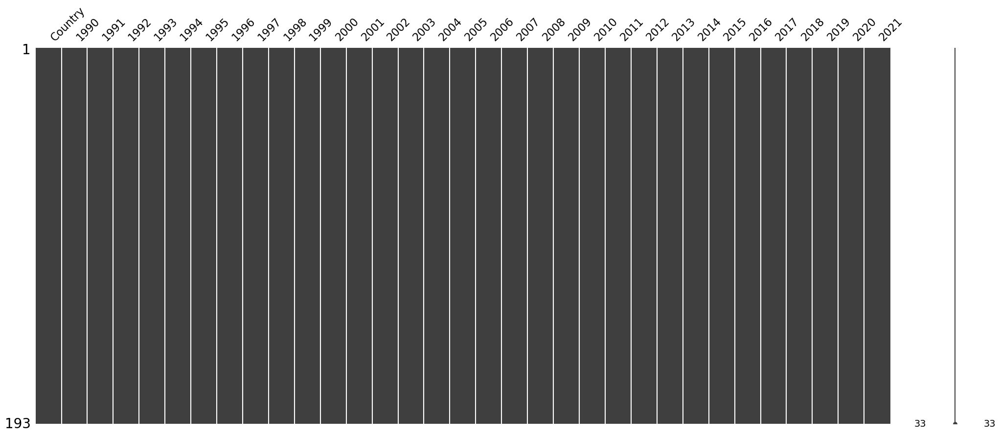

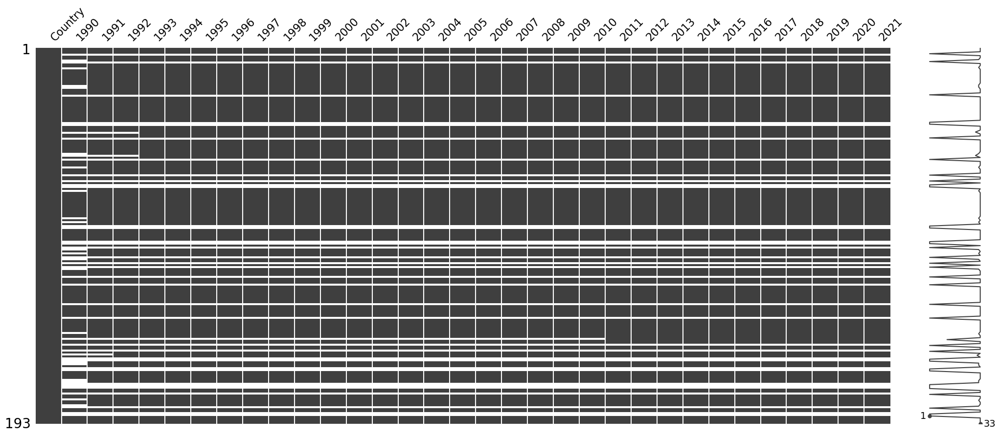

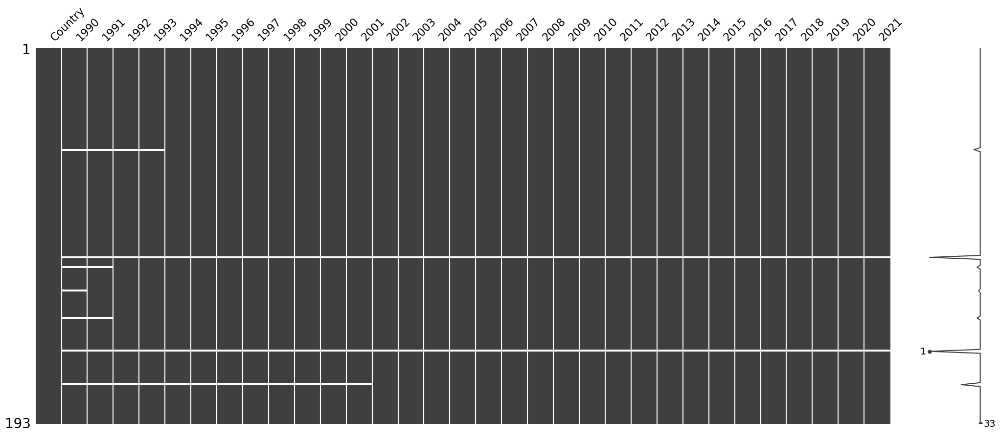

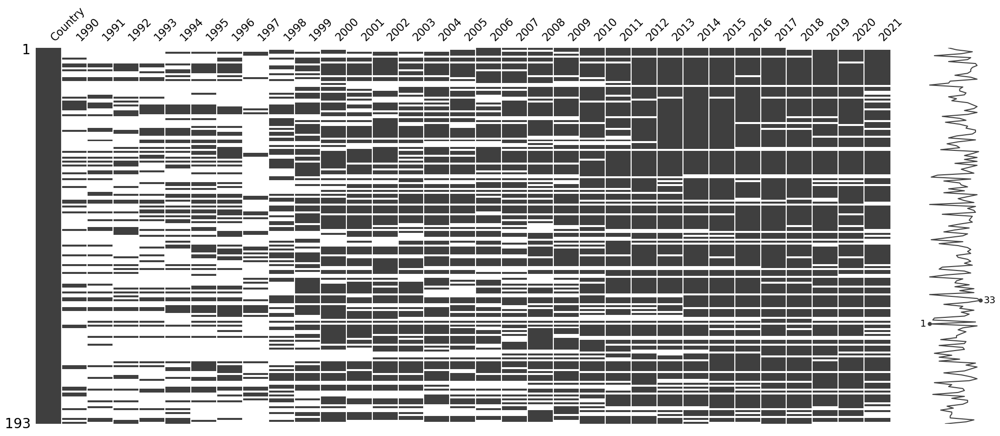

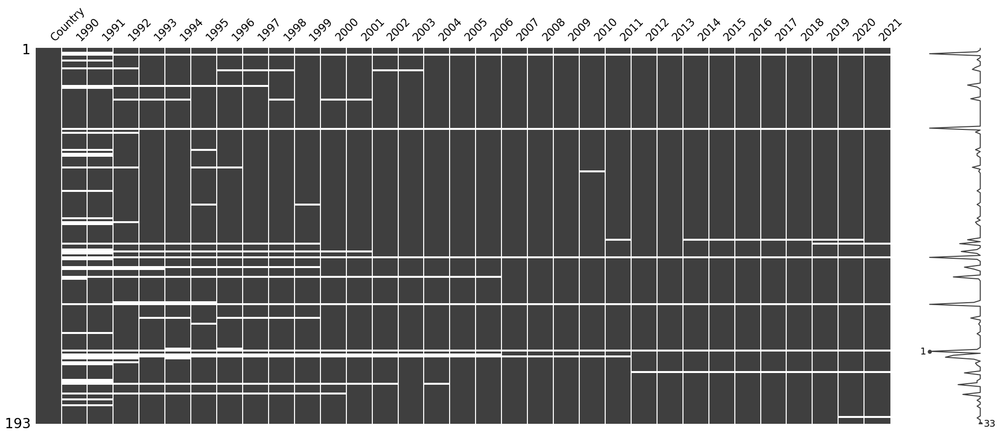

...

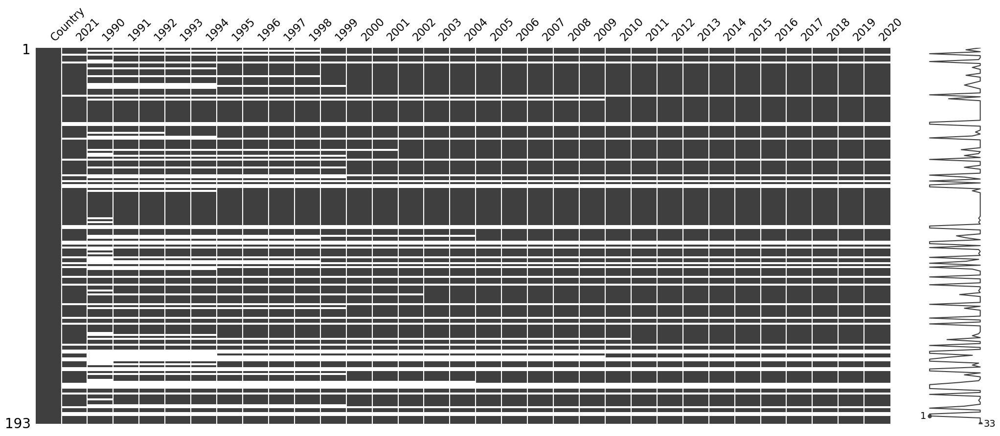

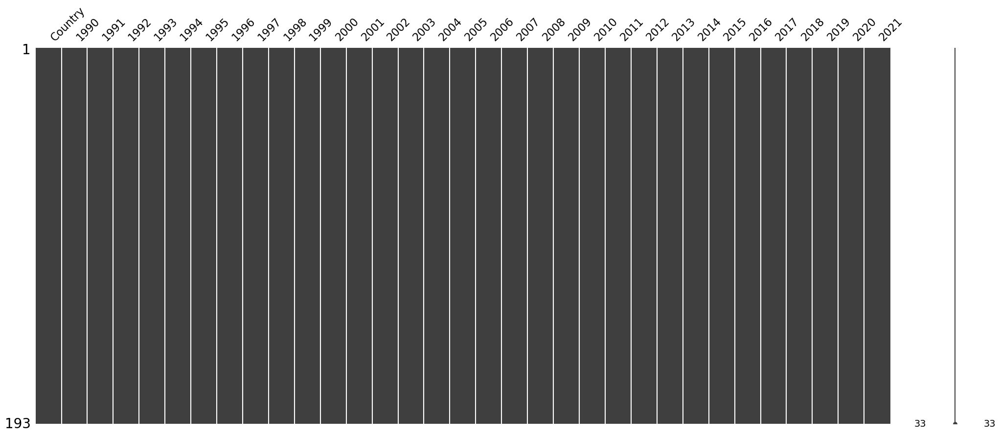

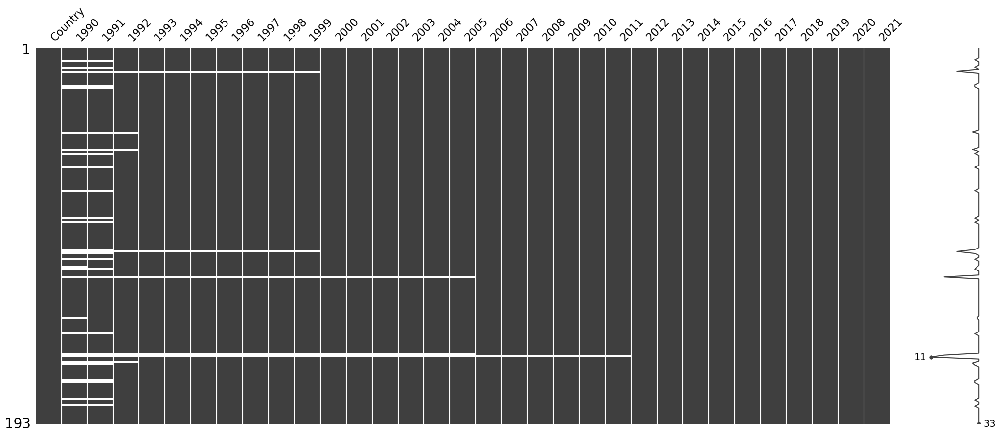

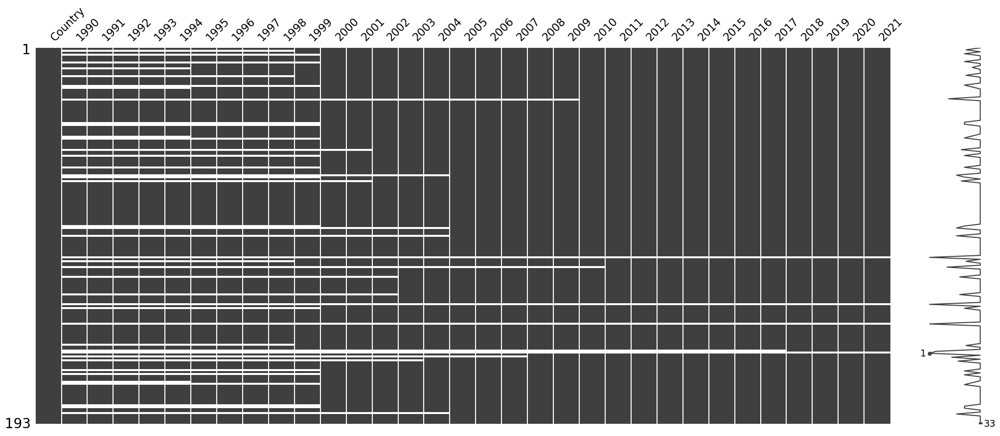

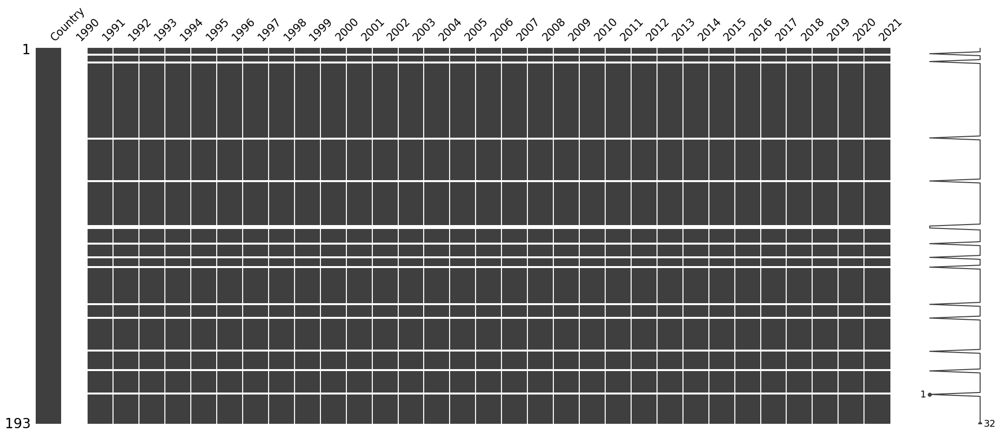

In [5]:
for i in keylist1:
    print(i)
    msno.matrix(dataframes_folder1[i])

As we can see, there are lots of missing vaues in all the tables. These values cannot be simply imputed using mean or median as that would paint a highly inacurate picture. Since the data is varying over time, we shall use more sophisticated techniques like spline imputation. After trying some polynomial and spline based techniques to fill missing data, the PchipInterpolator method was found most suitable for the given data. We shall create a function to interpolate. This function will implement PchipInterpolator in such a way that it only fills in the values from the first non-null value to the last non-null value for each row of these dataframes. The null vales at the start and end of the series are not imputed yet since such interpolation techniques can give very misleading or random results at beyond the end points of each series. 

In [6]:
def interpolate(df):
    df2 = df.copy()
    country_col = df2['Country'].values
    df2.drop(['Country'], axis = 1, inplace = True)
    for row_num in np.arange(df2.shape[0]):
         
        series = df2.iloc[row_num,:].reset_index(drop = True)
        non_null_vals = series.dropna().values
        non_null_indices = series.dropna().index
        
        
        if len(non_null_indices) >= 2:
            pchip_interpolator = PchipInterpolator(non_null_indices, non_null_vals)
            first_non_nul_index = non_null_indices[0]
            last_non_nul_index = non_null_indices[-1]
            for i in series.index.values:
                if (first_non_nul_index < i < last_non_nul_index) and pd.isna(series.values[i]):
                    df2.iloc[row_num,i] = pchip_interpolator(i)
    df2.insert(0, 'Country', country_col)
    return df2

<Axes: >

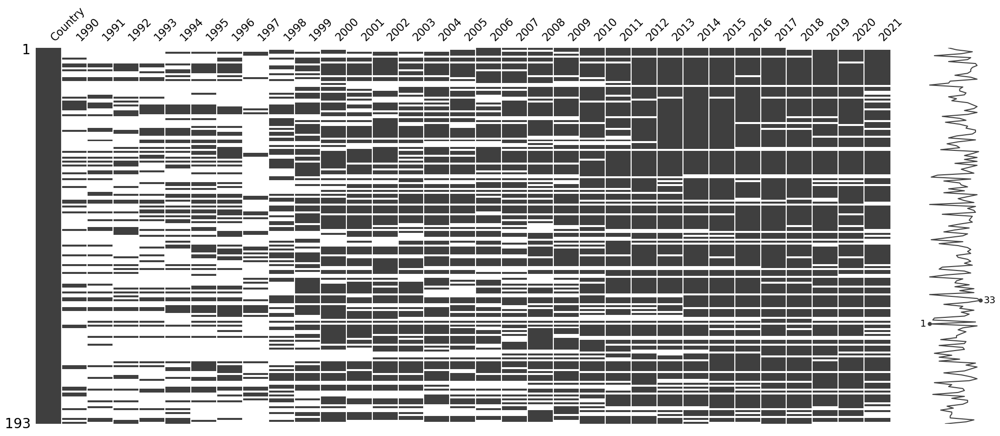

In [7]:
# Lets apply this function to any one of the dataframes and see how the data is filled.
# To check for missing values in any one of the dataframes
msno.matrix(dataframes_folder1['Education_Expenditure_government_percentage_of_GDP'])

<Axes: >

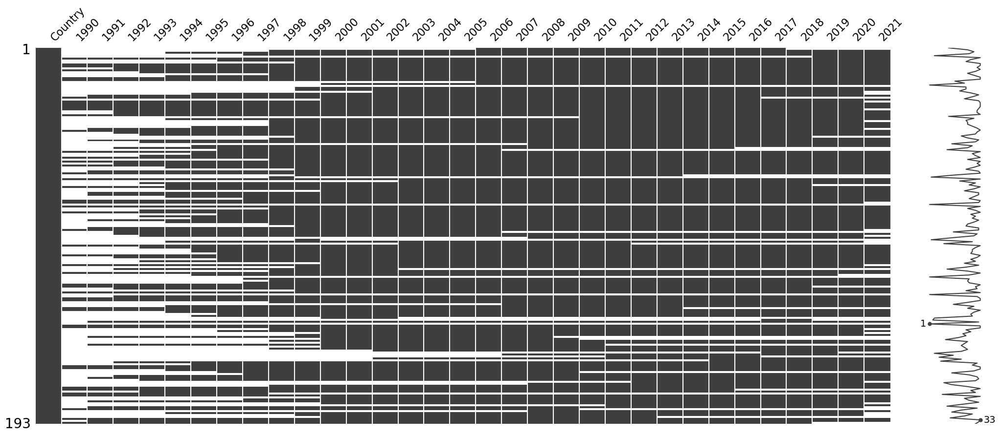

In [8]:
y = interpolate(dataframes_folder1['Education_Expenditure_government_percentage_of_GDP'])
# Missing values after interpolation
msno.matrix(y)

As we can observe the interpolator has filled many missing values

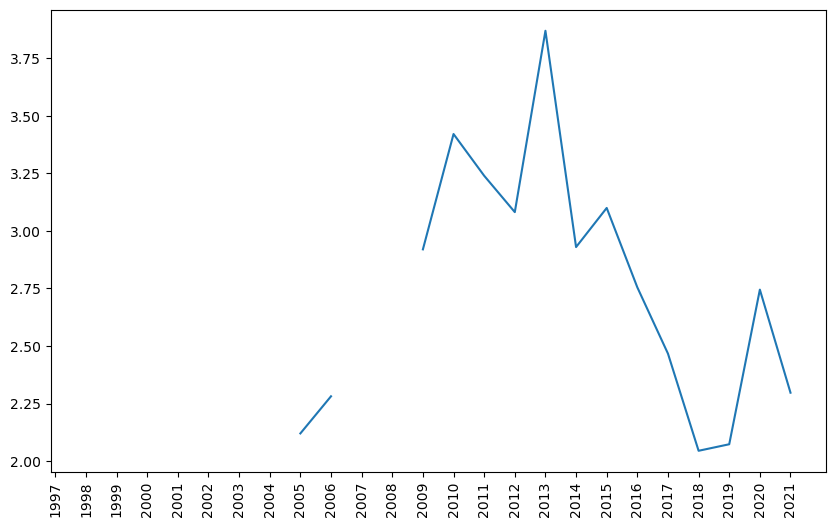

In [9]:
# Now lets check an individual row (country)
plt.figure(figsize=(10, 6))
plt.xticks(rotation=90)
plt.plot(dataframes_folder1['Education_Expenditure_government_percentage_of_GDP'].iloc[1,1:])

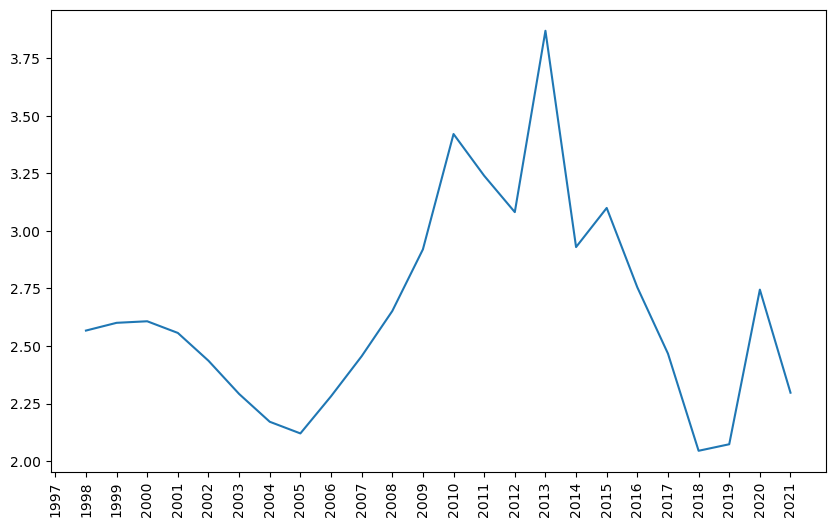

In [10]:
plt.figure(figsize=(10, 6))
plt.xticks(rotation=90)
plt.plot(y.iloc[1,1:])

In [11]:
# Now let us apply this function to all the tables

for i in keylist1:
    dataframes_folder1[i] = interpolate(dataframes_folder1[i])


In [12]:
combined_df1 = pd.concat(dataframes_folder1.values(), axis=1)

<Axes: >

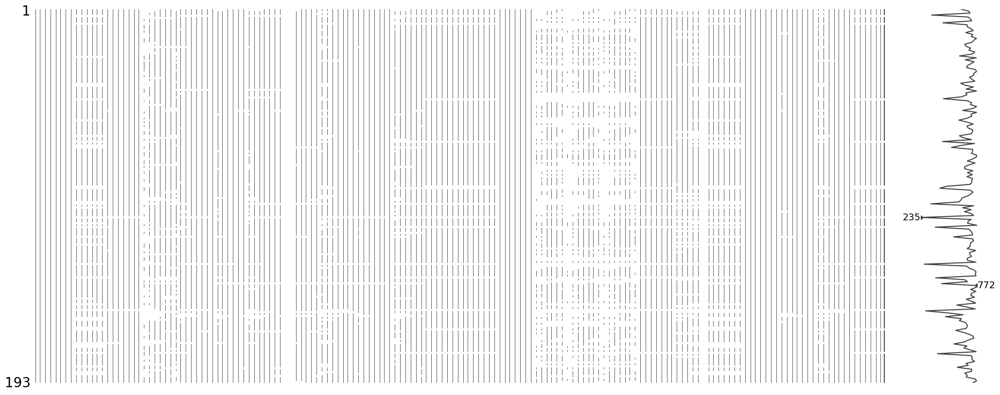

In [13]:
msno.matrix(combined_df1)

Adolescent_birth_rate
Annual_Material_footprint_per_capita_tons
CO2_per_capita_tons
Education_Expenditure_government_percentage_of_GDP
Foreign_direct_investments_inflow
GDP
GDP_per_capita
Government_Health_Expenditure_percentage_of_GDP
HDI
Income_per_capita
Income_per_capita_USD
Labour_force_participation_rate_female
Labour_force_participation_rate_male
Life_expectancy
Literacy_rates
Literacy_rates_females
Literacy_rates_males
Maternal_Mortality_Ratio
Oil_Consumption_per_capita_kg
Planetary_pressure_adjusted_HDI
Population
Population_density
Schooling_years_mean


C:\Users\Admin\anaconda3\Lib\site-packages\missingno\missingno.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=figsize)


Unemployment_rates


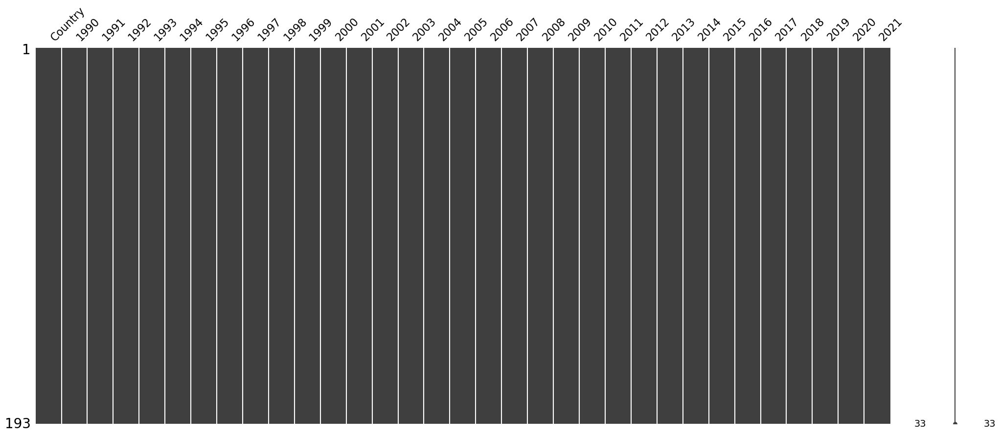

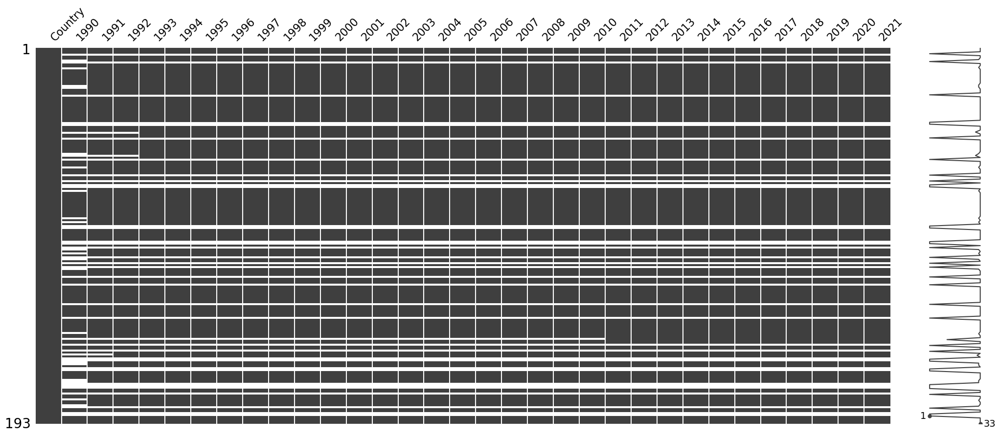

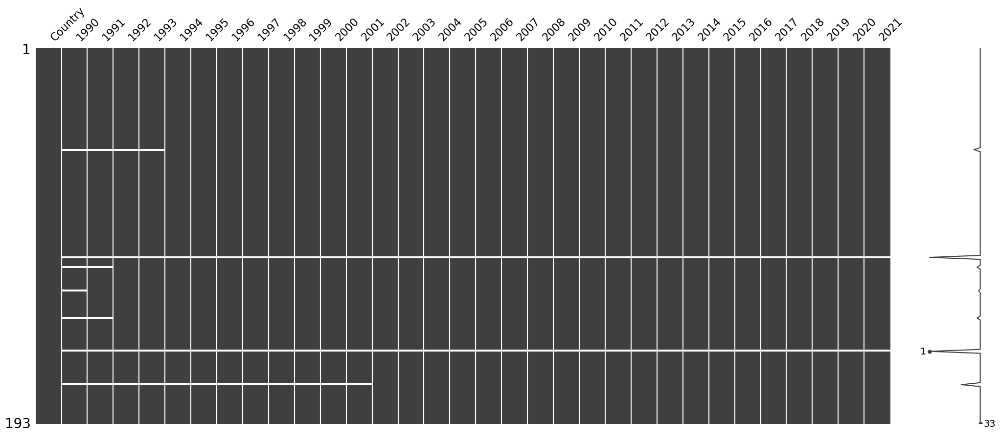

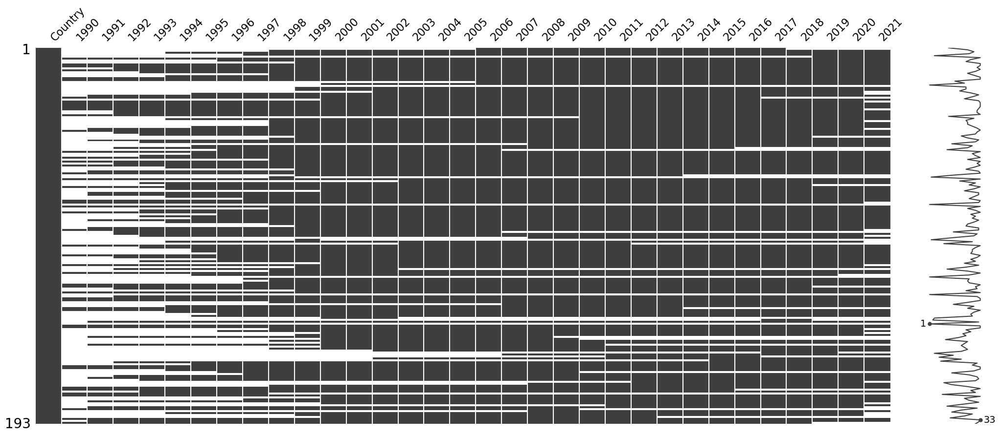

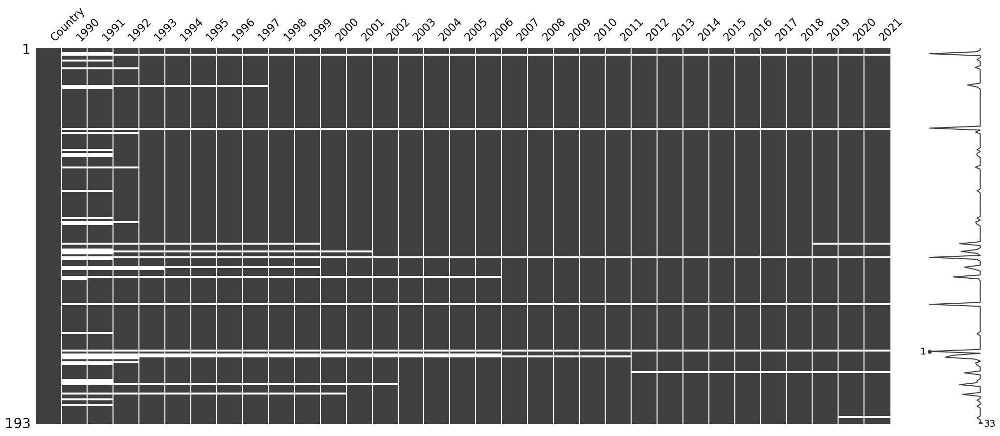

...

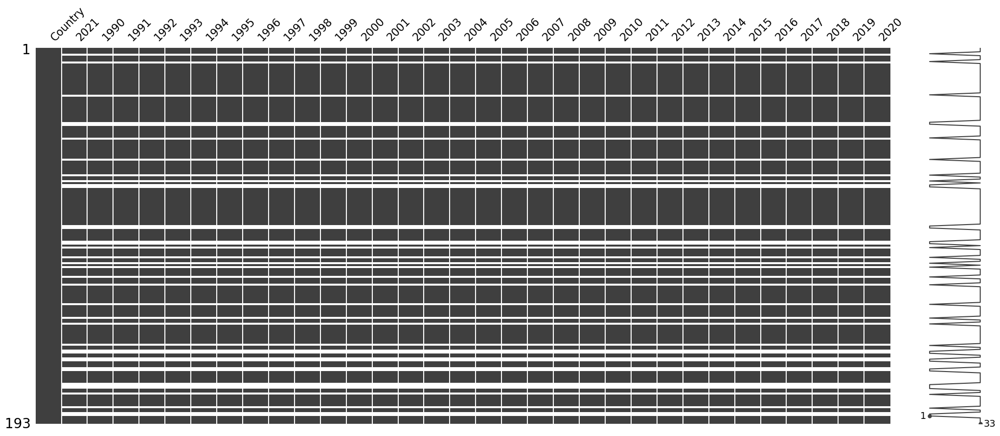

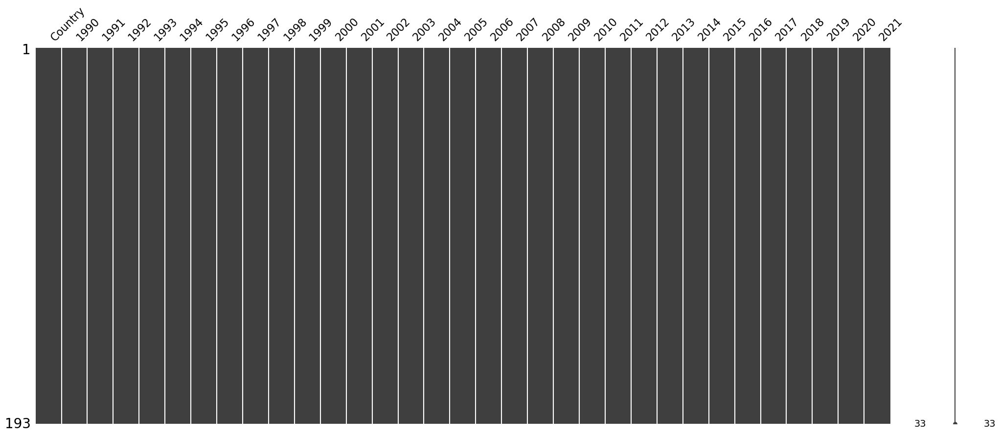

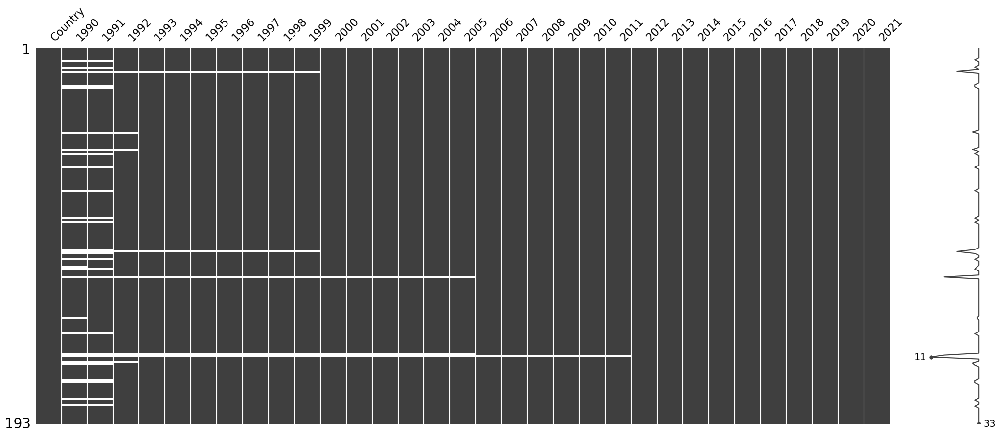

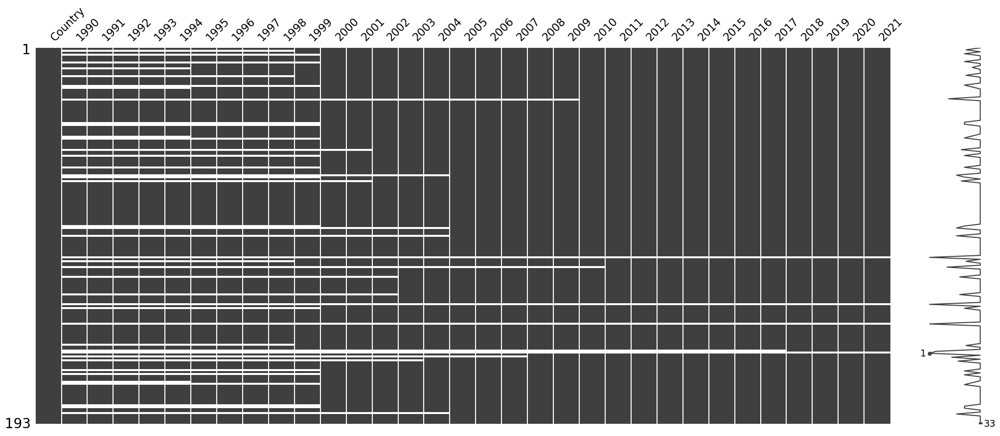

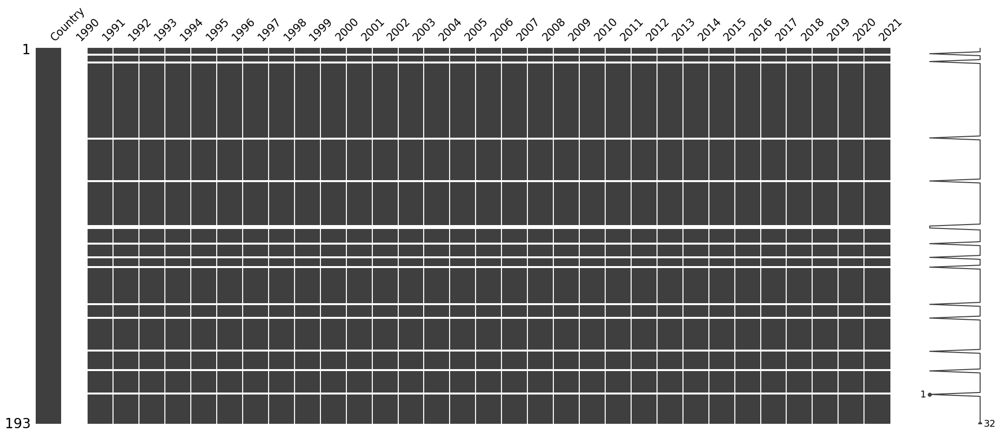

In [14]:
for i in keylist1:
    print(i)
    msno.matrix(dataframes_folder1[i])

In [15]:
# Since some tables contain a lot of missing values that cannot be reliably imputed, we shall drop these features.
keys_to_delete = ['Annual_Material_footprint_per_capita_tons','HDI', 'Planetary_pressure_adjusted_HDI', 'Schooling_years_mean', 'Education_Expenditure_government_percentage_of_GDP', 'Literacy_rates','Literacy_rates_females', 'Literacy_rates_males', 'Oil_Consumption_per_capita_kg','Income_per_capita_USD']
for key in keys_to_delete:
        del dataframes_folder1[key]

Adolescent_birth_rate
CO2_per_capita_tons
Foreign_direct_investments_inflow
GDP
GDP_per_capita
Government_Health_Expenditure_percentage_of_GDP
Income_per_capita
Labour_force_participation_rate_female
Labour_force_participation_rate_male
Life_expectancy
Maternal_Mortality_Ratio
Population
Population_density
Unemployment_rates


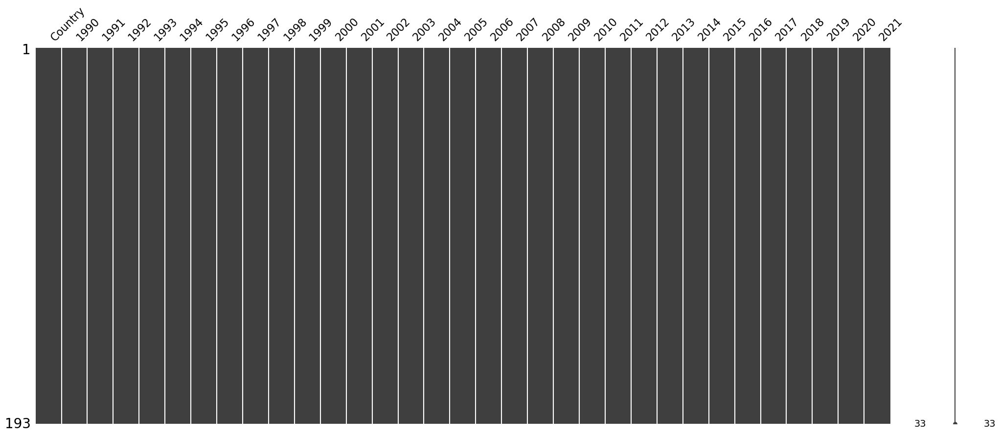

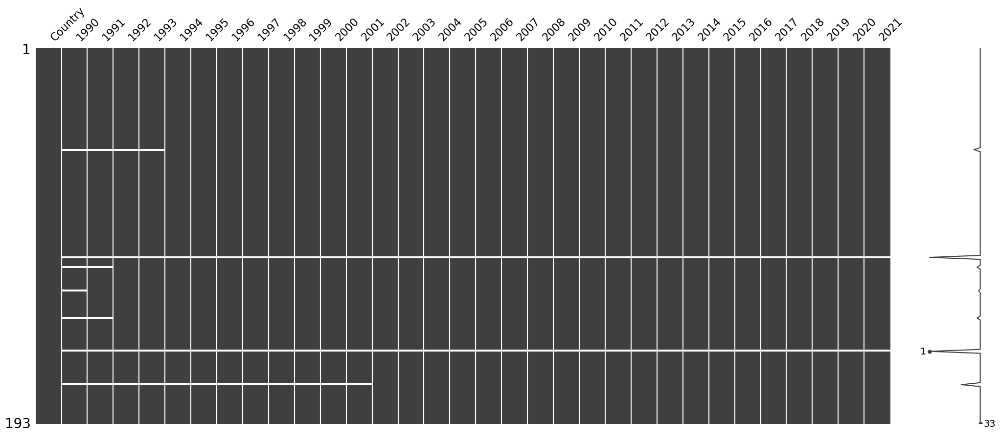

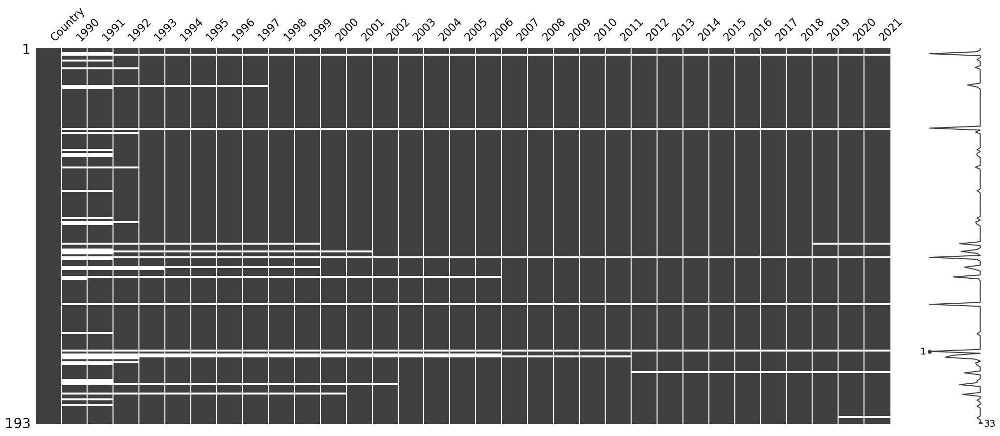

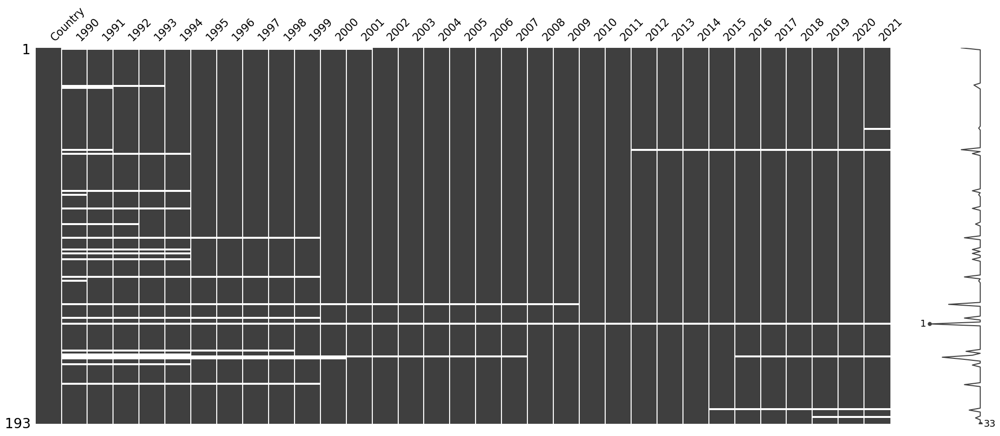

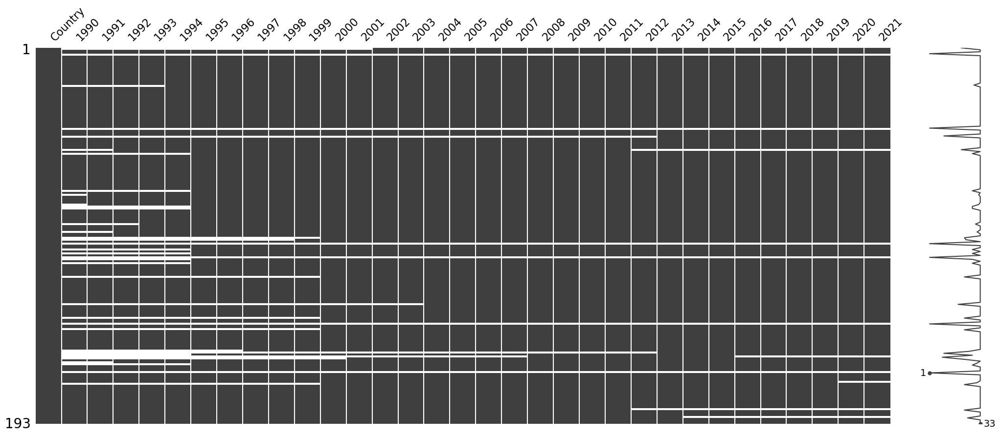

...

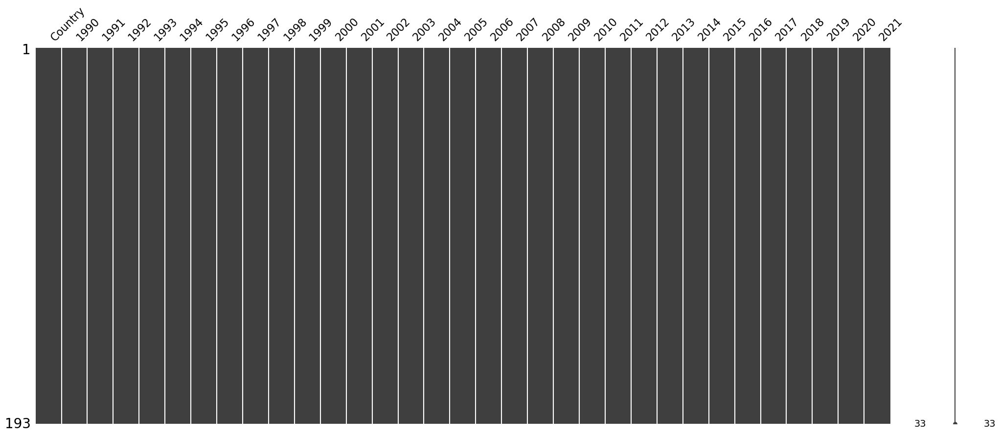

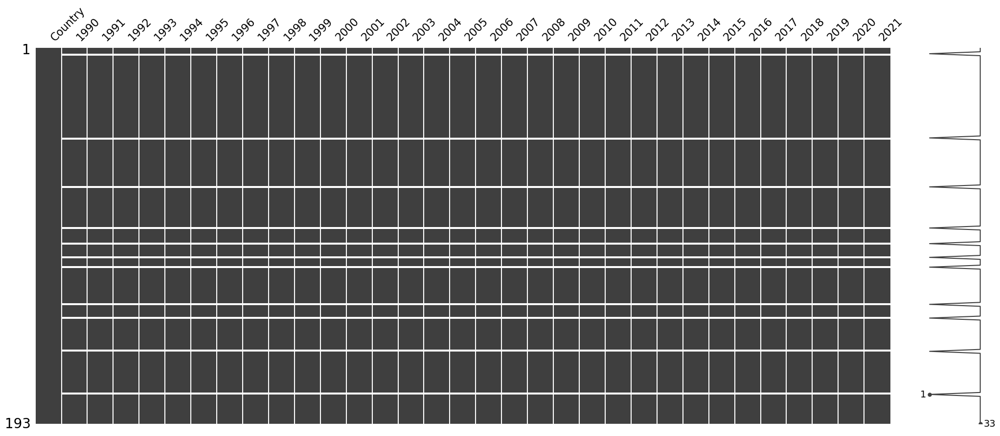

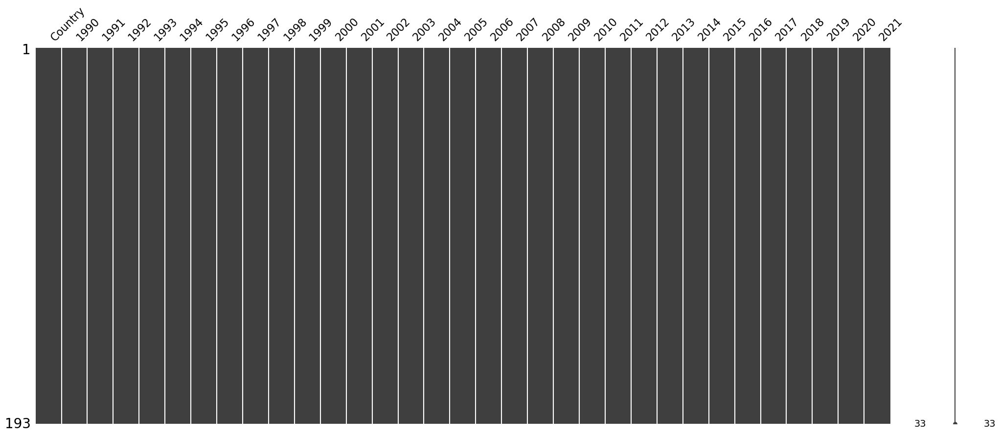

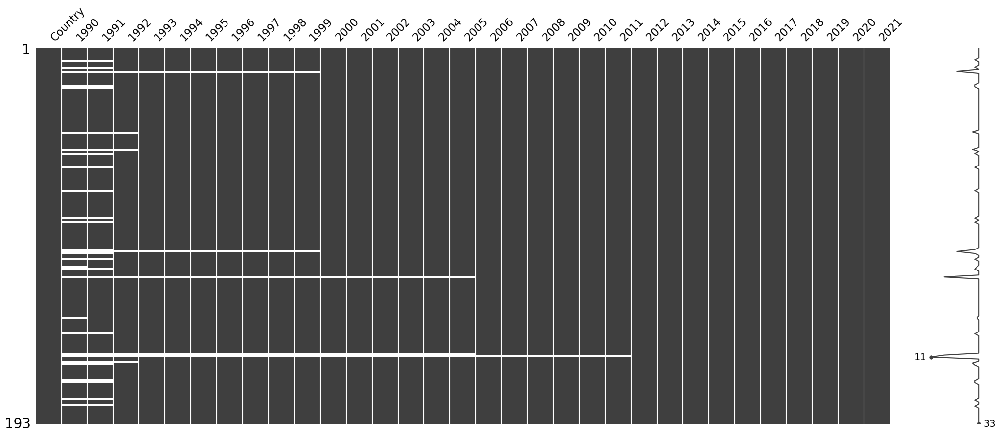

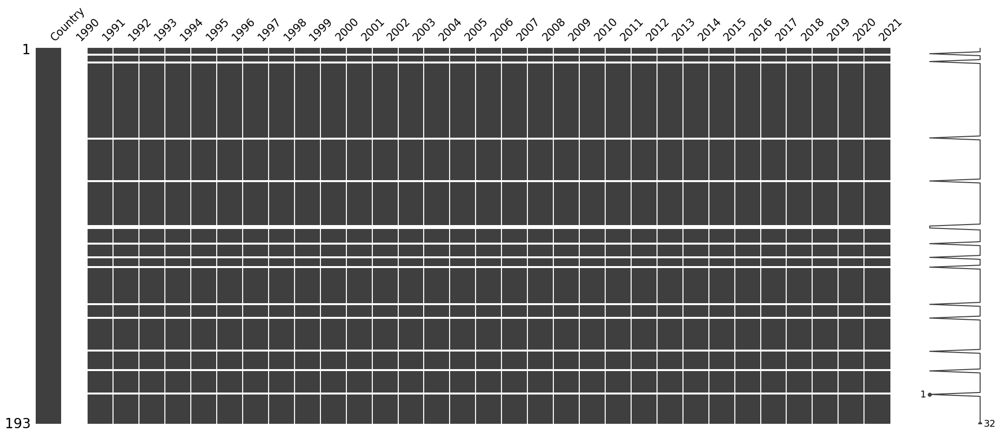

In [16]:
for i in keylist1:
    if i in dataframes_folder1.keys():
        print(i)
        msno.matrix(dataframes_folder1[i])

In [17]:
dataframes_folder11 = dataframes_folder1.copy()

In [18]:
# Extracting country names of rows that are completely empty
list = []
for i in dataframes_folder11.keys():
    df = dataframes_folder11[i]
    for j in np.arange(df.shape[0]):
        if df.iloc[j,1:].isna().all() == True:
            list.append(df.iloc[j,0])
country_set1 = set(list)

In [19]:
country_set1

{'Andorra',
 'Antigua and Barbuda',
 'Cuba',
 'Dominica',
 'Grenada',
 'Hong Kong',
 'Kiribati',
 'Liechtenstein',
 'Marshall Islands',
 'Monaco',
 'Nauru',
 'North Korea',
 'Palau',
 'Saint Kitts and Nevis',
 'San Marino',
 'Seychelles',
 'Somalia',
 'Syrian Arab Republic',
 'Tuvalu'}

In [20]:
# Lets delete these countries from our dataset
# We shall find the indices of the rows to delete

list = []
for i in dataframes_folder11['GDP'].index:
    if dataframes_folder11['GDP'].iloc[i,0] in (country_set1):
        list.append(i)

In [21]:
# lets drop these countries from all dataframes
for i in dataframes_folder11.keys():
    dataframes_folder11[i].drop(index = list, inplace = True)
    dataframes_folder11[i].reset_index(drop = True,inplace = True)

Adolescent_birth_rate
CO2_per_capita_tons
Foreign_direct_investments_inflow
GDP
GDP_per_capita
Government_Health_Expenditure_percentage_of_GDP
Income_per_capita
Labour_force_participation_rate_female
Labour_force_participation_rate_male
Life_expectancy
Maternal_Mortality_Ratio
Population
Population_density
Unemployment_rates


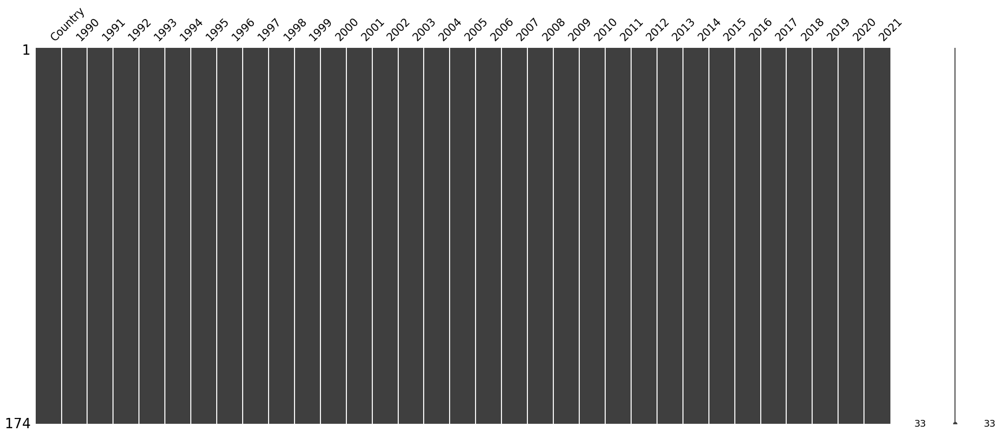

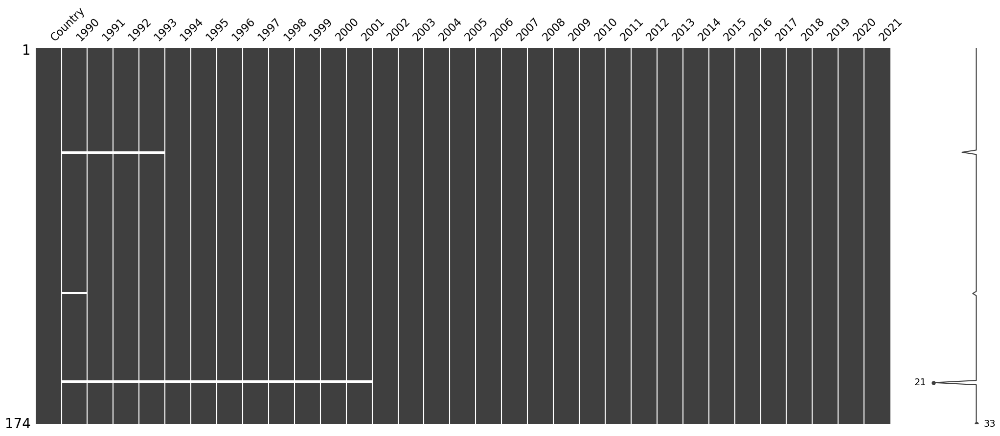

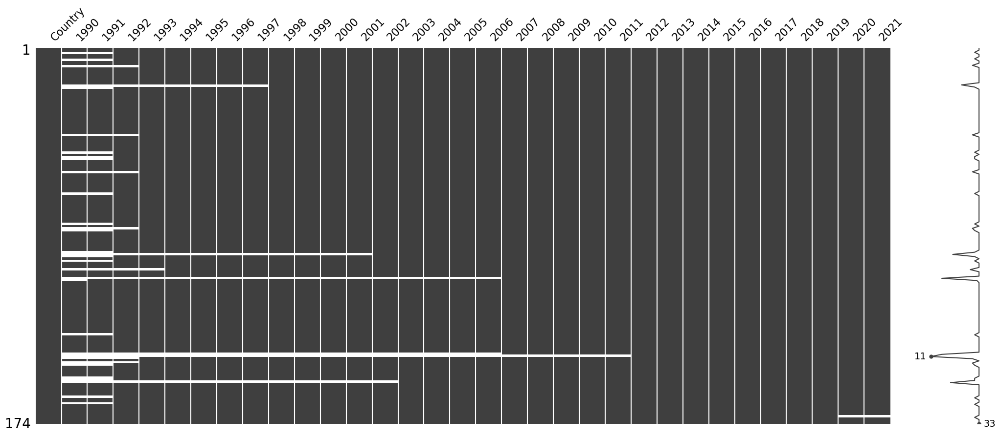

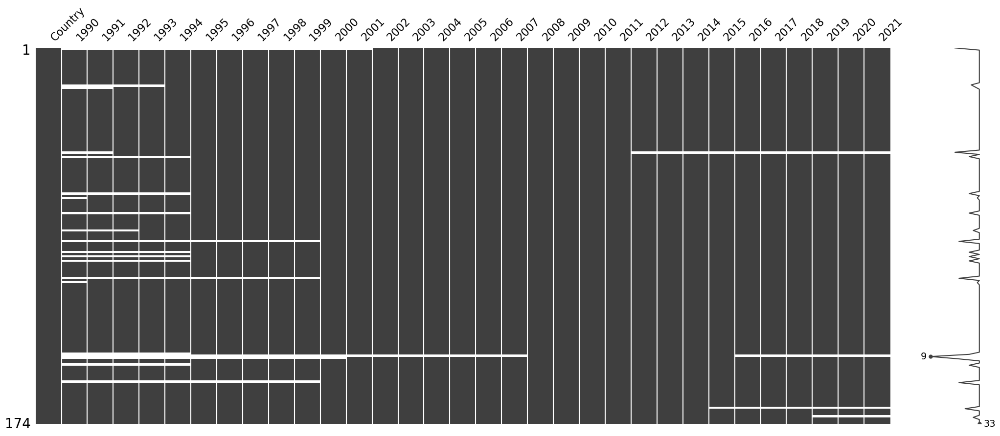

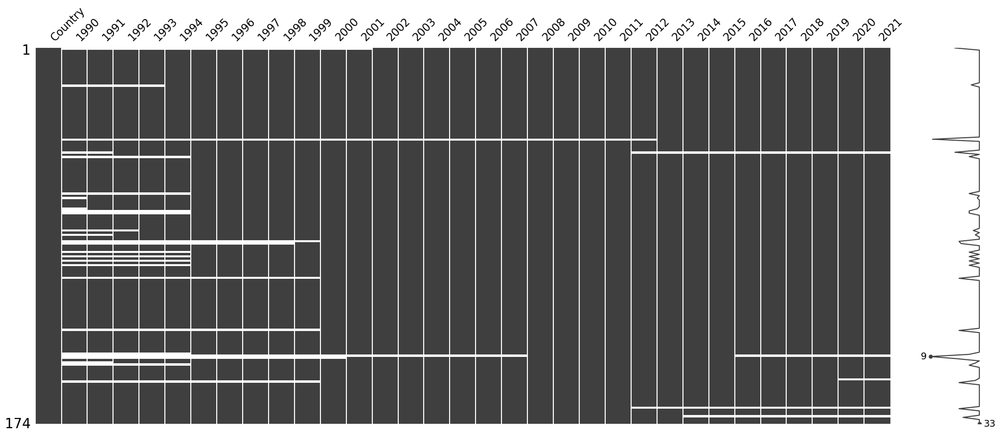

...

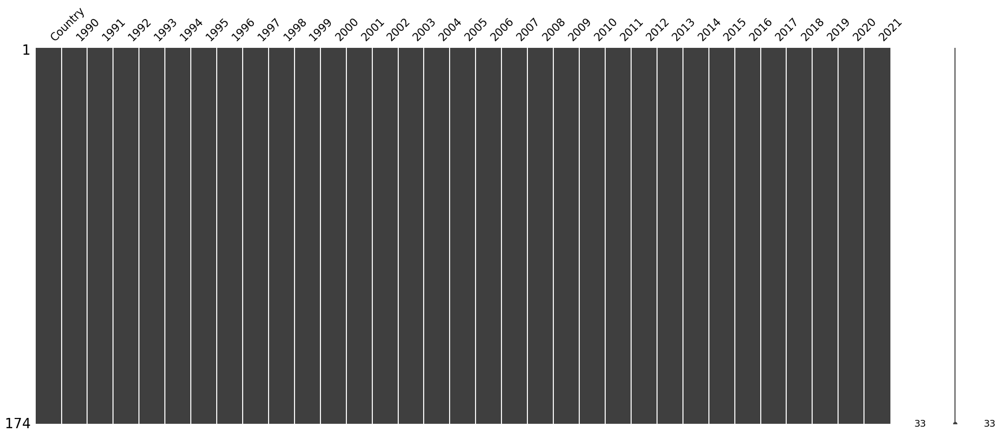

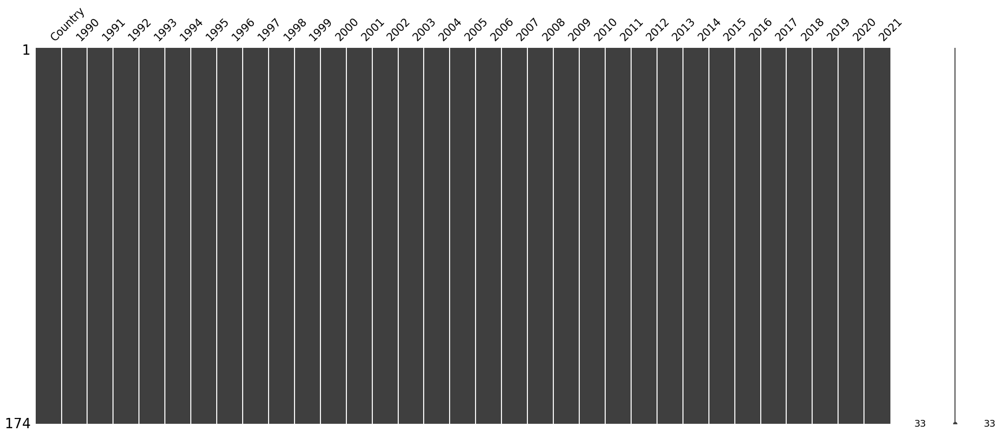

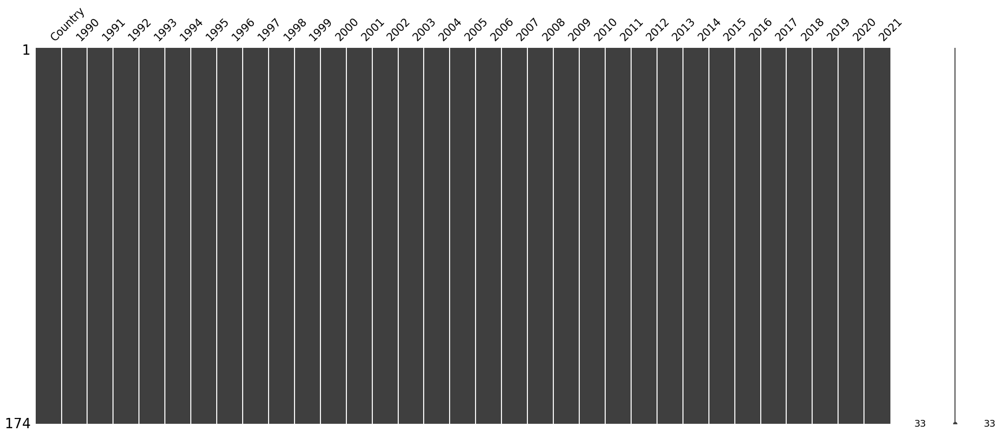

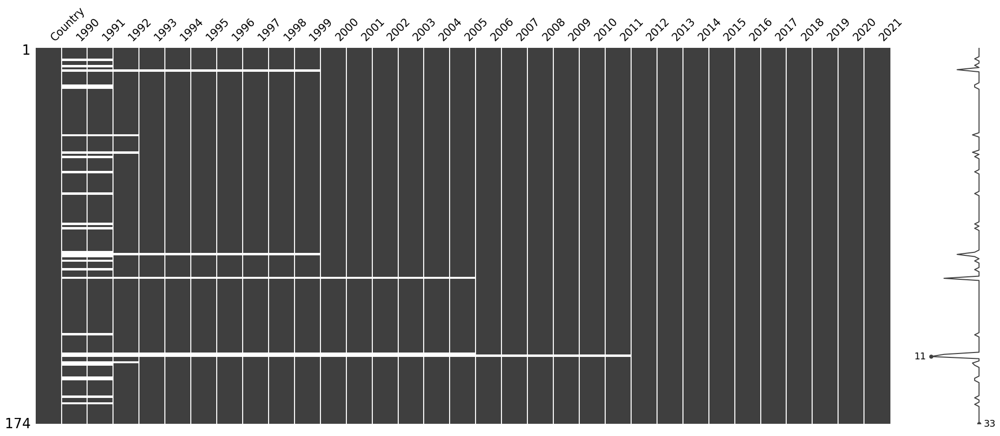

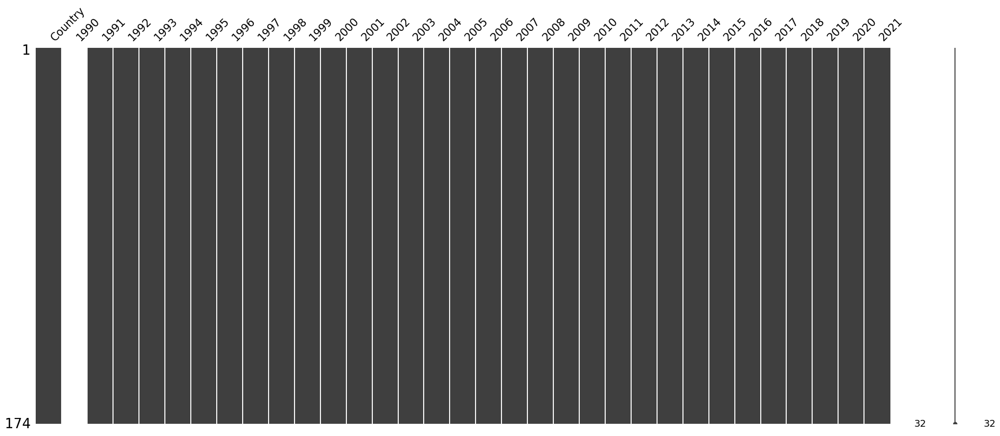

In [22]:
for i in dataframes_folder11.keys():
    print(i)
    msno.matrix(dataframes_folder11[i])

Lets create a row named World in the countries column of every dataframe and use averages, weighted averages and sums for different features
Creating a list of counties for which the 'World' row is the sum of a variable value for all the countries. For the remaining variables, the 'World' row will represent the weighted average of the variable for all the countries.

In [23]:

list_sum = ['Foreign_direct_investments_inflow','GDP','Population']

dataframes_folderA = dataframes_folder11.copy()

Mul_matrix_df = dataframes_folder11['Population'].copy()

world_pop_row = []
for i in np.arange(len(Mul_matrix_df.columns)-1):
    world_pop_row.append(Mul_matrix_df.iloc[:,i+1].sum())

Mul_matrix_df.loc[len(Mul_matrix_df)] = ['World'] + world_pop_row

for i in np.arange(Mul_matrix_df.shape[0]):
    for j in np.arange(1, Mul_matrix_df.shape[1]):
        Mul_matrix_df.iloc[i,j] = Mul_matrix_df.iloc[i,j]/Mul_matrix_df.iloc[-1,j]

Mul_matrix_df = Mul_matrix_df.drop(Mul_matrix_df.index[-1])

def return_weighted_df(df):
    df2 = df.copy()
    df2.iloc[:,1:] = df2.iloc[:,1:]*Mul_matrix_df.iloc[:,1:] 
    new_row = df2.sum()
    df2.loc[len(df2)] = new_row 
    df2.iloc[-1,0] = 'World' 
    df2.iloc[:-2,:] = df.iloc[:-1,:]
    return df2
    
def return_sum(df):
    df2 = df.copy()
    new_row = df2.sum()
    df2.loc[len(df2)] = new_row
    df2.iloc[-1,0] = 'World' 
    df2.iloc[:-2,:] = df.iloc[:-1,:]
    return df2

for i in dataframes_folderA.keys():
    if i in list_sum:
        dataframes_folderA[i] = return_sum(dataframes_folderA[i])
    else:
        dataframes_folderA[i] = return_weighted_df(dataframes_folderA[i])

Now since the data is dealing with historic values of countries for various prameters, it seems inapropriate to impute the remaining values which can create incorrect values. Thus this will be the final dataset that we shall use.

In [24]:
# We shall also create a combined dataframe to extract data for all features.

dataframes_folder111 = dataframes_folderA.copy()

df = dataframes_folderA['GDP'].copy()
df = df.melt(id_vars='Country', var_name='Year', value_name = 'GDP')
country_col = df['Country'].values
year_col = df['Year'].values

list1 = [i for i in dataframes_folder111.keys()]
for i in list1:
    dataframes_folder111[i] = dataframes_folder111[i].melt(id_vars='Country', var_name='Year', value_name = i)
    dataframes_folder111[i].drop(['Country','Year'] , axis = 1, inplace = True)

Master_df = pd.concat([i for i in dataframes_folder111.values()], axis=1)

Master_df.insert(0, 'Year', year_col)
Master_df.insert(0, 'Country', country_col)
Master_df.head(10)

,Country,Year,Adolescent_birth_rate,CO2_per_capita_tons,Foreign_direct_investments_inflow,GDP,GDP_per_capita,Government_Health_Expenditure_percentage_of_GDP,Income_per_capita,Labour_force_participation_rate_female,Labour_force_participation_rate_male,Life_expectancy,Maternal_Mortality_Ratio,Population,Population_density,Unemployment_rates
0,Afghanistan,1990,142.960,0.209727,1.000000e+01,NaN,NaN,NaN,2684.550019,15.180,77.430,45.9672,1500.0,10694796.0,16.397277,NaN
1,Angola,1990,198.803,0.429586,-3.348000e+08,1.123628e+10,3283.170843,NaN,4845.706901,75.408,79.292,41.8933,1150.0,11828638.0,9.487959,NaN
2,Albania,1990,14.815,1.656902,NaN,2.028554e+09,2549.234816,NaN,4742.215529,51.364,72.510,73.1439,40.0,3286542.0,119.946788,NaN
3,United Arab Emirates,1990,48.493,28.277672,-1.158200e+08,5.070144e+10,86852.684475,NaN,102433.136000,29.083,91.714,71.9004,13.0,1900151.0,26.755153,NaN
4,Argentina,1990,70.928,3.436043,1.836000e+09,1.413527e+11,7183.583826,NaN,13597.686360,45.041,74.389,71.7837,84.0,32637657.0,11.925961,NaN
5,Armenia,1990,73.201,2.533032,NaN,2.256863e+09,2756.573324,NaN,5210.201884,44.833,62.743,68.8209,52.0,3556539.0,NaN,NaN
6,Australia,1990,21.673,16.471401,8.457777e+09,3.114205e+11,17380.881688,NaN,29069.154880,52.218,75.544,77.0443,8.0,17065128.0,2.221357,NaN
7,Austria,1990,22.827,8.045120,6.530000e+08,1.664634e+11,19459.185382,NaN,38902.262670,43.006,69.381,75.7396,8.0,7677850.0,93.042293,NaN
8,Azerbaijan,1990,31.329,7.094035,NaN,8.884848e+09,5253.446608,NaN,7664.923538,67.539,78.281,62.3522,37.0,7175200.0,NaN,NaN
9,Burundi,1990,74.130,0.038399,1.255435e+06,1.132101e+09,609.371648,NaN,1124.247756,90.555,90.065,44.8599,1290.0,5483793.0,213.543341,NaN


In [25]:
Master_df[(Master_df['Country'] == 'India')]

,Country,Year,Adolescent_birth_rate,CO2_per_capita_tons,Foreign_direct_investments_inflow,GDP,GDP_per_capita,Government_Health_Expenditure_percentage_of_GDP,Income_per_capita,Labour_force_participation_rate_female,Labour_force_participation_rate_male,Life_expectancy,Maternal_Mortality_Ratio,Population,Population_density,Unemployment_rates
71,India,1990,122.287,0.662468,2.366900e+08,3.209790e+11,1204.242059,NaN,1790.407349,30.443,84.227,58.6516,599.0,8.704522e+08,292.767084,NaN
246,India,1991,128.465,0.691062,7.353764e+07,2.701053e+11,1231.955439,NaN,1768.858819,30.453,84.093,59.0547,570.0,8.889418e+08,298.985856,6.838
421,India,1992,128.913,0.721465,2.765124e+08,2.882081e+11,1301.824124,NaN,1828.853344,30.493,83.966,59.4524,544.0,9.075740e+08,305.252624,6.838
596,India,1993,123.529,0.730983,5.503700e+08,2.792956e+11,1367.697536,NaN,1880.994675,30.570,83.838,59.8152,519.0,9.263513e+08,311.568146,6.838
771,India,1994,124.343,0.758160,9.732715e+08,3.272756e+11,1460.115434,NaN,1969.856125,30.692,83.699,60.2158,492.0,9.452620e+08,317.928541,6.830
946,India,1995,122.403,0.790645,2.143628e+09,3.602819e+11,1572.021447,NaN,2082.000116,30.656,83.461,60.5962,468.0,9.642791e+08,324.324759,6.998
1121,India,1996,114.425,0.840745,2.426057e+09,3.928969e+11,1688.386407,NaN,2201.077996,30.621,83.221,60.9841,446.0,9.832812e+08,330.715904,7.165
1296,India,1997,111.706,0.858913,3.577330e+09,4.158676e+11,1753.085925,NaN,2249.544553,30.584,82.977,61.3876,423.0,1.002335e+09,337.124513,7.339
1471,India,1998,110.369,0.860924,2.634652e+09,4.213513e+11,1847.256696,NaN,2345.162554,30.548,82.730,61.7919,405.0,1.021435e+09,343.548369,7.511
1646,India,1999,104.382,0.916855,2.168591e+09,4.588204e+11,2001.634107,NaN,2509.046377,30.512,82.483,62.2069,388.0,1.040500e+09,349.960835,7.680


## **Exploratory Data Analysis**

Now that we have everything in place, lets begin the analysis

In [26]:
Master_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5600 entries, 0 to 5599
Data columns (total 16 columns):
 #   Column                                           Non-Null Count  Dtype  
---  ------                                           --------------  -----  
 0   Country                                          5600 non-null   object 
 1   Year                                             5600 non-null   object 
 2   Adolescent_birth_rate                            5600 non-null   float64
 3   CO2_per_capita_tons                              5583 non-null   float64
 4   Foreign_direct_investments_inflow                5450 non-null   float64
 5   GDP                                              5450 non-null   float64
 6   GDP_per_capita                                   5386 non-null   float64
 7   Government_Health_Expenditure_percentage_of_GDP  3643 non-null   float64
 8   Income_per_capita                                5547 non-null   float64
 9   Labour_force_participation_rat

In [27]:
Master_df.describe()

,Adolescent_birth_rate,CO2_per_capita_tons,Foreign_direct_investments_inflow,GDP,GDP_per_capita,Government_Health_Expenditure_percentage_of_GDP,Income_per_capita,Labour_force_participation_rate_female,Labour_force_participation_rate_male,Life_expectancy,Maternal_Mortality_Ratio,Population,Population_density,Unemployment_rates
count,5600.000000,5583.000000,5.450000e+03,5.450000e+03,5386.000000,3643.000000,5547.000000,5600.000000,5600.000000,5600.000000,5600.000000,5.600000e+03,5479.000000,5426.000000
mean,60.732083,4.679409,1.498937e+10,6.186961e+11,14698.806692,5.979022,16300.527572,50.298308,72.615414,67.886155,236.226722,7.424387e+07,166.828252,8.097613
std,47.545299,6.556297,1.187585e+11,4.567743e+12,18396.393581,2.547167,18320.125690,16.518185,10.461109,10.904968,349.456227,5.086910e+08,535.591078,6.064955
min,0.188322,0.000818,-3.303385e+11,7.595113e+07,2.498500,0.000000,2.933074,0.145156,0.165131,0.081587,0.850633,9.872700e+04,0.050785,0.000000
25%,19.727500,0.490947,5.532539e+07,4.866315e+09,2755.145110,4.055667,3176.726687,41.368250,66.571500,61.877025,15.000000,2.562630e+06,23.551339,3.710250
50%,49.525000,2.198837,4.797571e+08,2.014459e+10,7633.195670,5.587373,9519.871916,50.917500,73.472500,70.352150,73.000000,8.095562e+06,66.460385,6.410000
75%,91.175250,6.691736,2.841163e+09,1.362799e+11,19527.677476,7.709818,22522.638550,60.757250,79.397500,75.430400,328.250000,2.614714e+07,134.708365,10.850750
max,214.486000,68.723812,2.934931e+12,9.521395e+13,163219.491990,20.413412,104640.280700,90.555000,96.196000,84.783900,2990.000000,7.768291e+09,7965.878492,38.800000


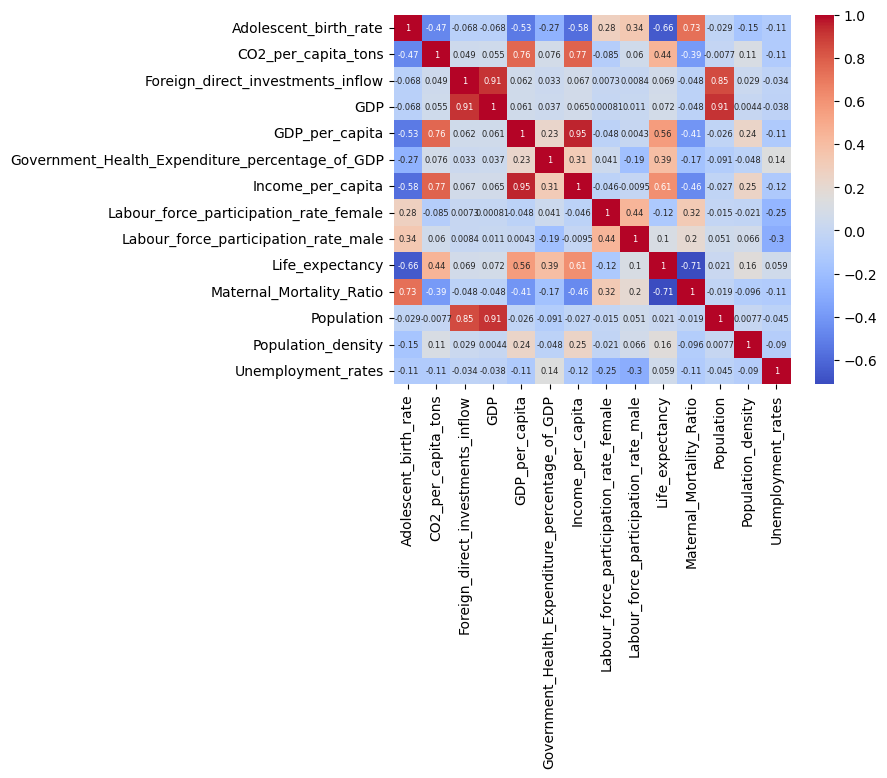

In [28]:
sns.heatmap(Master_df.select_dtypes(include=['number']).corr(), annot=True, cmap='coolwarm',annot_kws={"size": 6})
plt.show()

#### Observations: 
This graph clearly shows strong correlations between the following features:
1. Adolescent_birth_rate & Maternal_Mortality_Ratio: 0.73
2. CO2_per_capita_tons & Income_per_capita: 0.77
3. Income_per_capita & Life_expectancy: 0.66
4. Life_expectancy & Maternal_Mortality_Ratio: -0.88
5. Population & GDP: 0.43
6. Government_Health_Expenditure_percentage_of_GDP & Life_expectancy: 0.37

#### Lets explore the effects of a country's economic growth on the health and lifespan of its citizens

Government_Health_Expenditure_percentage_of_GDP & GDP have a correlation coefficient of 0.35 suggesting a mild positive correlation.
Insight: This indicates that as a country's GDP increases, its government tends to spend more on health expenditure.

Also, a correlation of 0.37 suggests a significant association between Government_Health_Expenditure_percentage_of_GDP & Life_expectancy

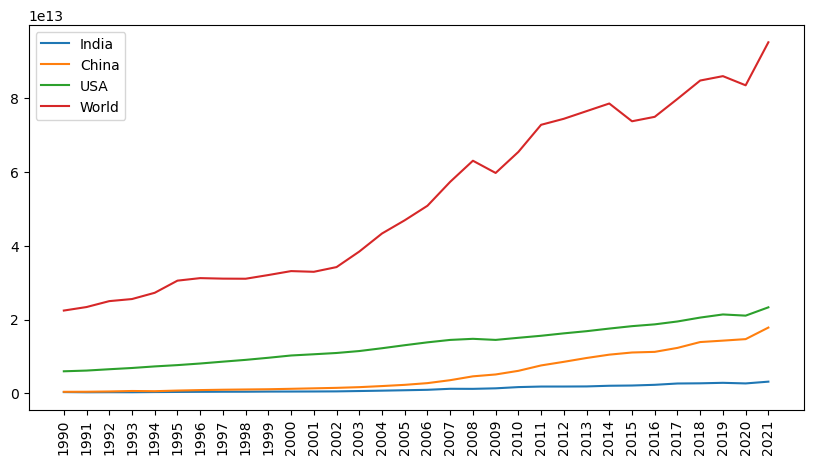

In [29]:
plt.figure(figsize=(10, 5))
plt.xticks(rotation=90)
plt.plot(np.unique(year_col), Master_df[Master_df['Country'] == 'India']['GDP'].values, label='India')
plt.plot(np.unique(year_col), Master_df[Master_df['Country'] == 'China']['GDP'].values, label='China')
plt.plot(np.unique(year_col), Master_df[Master_df['Country'] == 'United States']['GDP'].values, label='United States')
plt.plot(np.unique(year_col), Master_df[Master_df['Country'] == 'World']['GDP'].values, label='World')
plt.legend(labels=['India', 'China', 'USA','World'])

Lets find out if there is a relation between life expectancy and government health expenditure

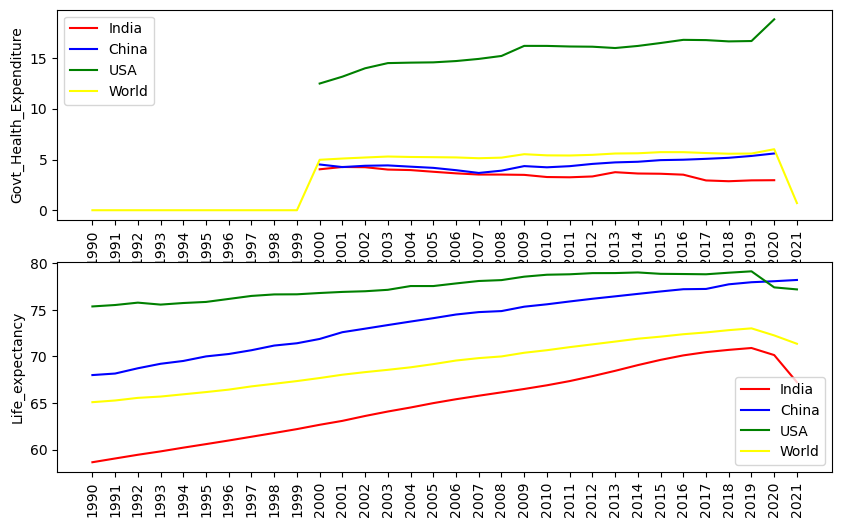

In [30]:
plt.figure(figsize=(10, 6))
ax1 = plt.subplot(211)  # 2 rows, 1 column, 1st subplot
ax1.plot(np.unique(year_col), Master_df[Master_df['Country'] == 'India']['Government_Health_Expenditure_percentage_of_GDP'].values, color='red')
ax1.plot(np.unique(year_col), Master_df[Master_df['Country'] == 'China']['Government_Health_Expenditure_percentage_of_GDP'].values, color='blue')
ax1.plot(np.unique(year_col), Master_df[Master_df['Country'] == 'United States']['Government_Health_Expenditure_percentage_of_GDP'].values, color='green')
ax1.plot(np.unique(year_col), Master_df[Master_df['Country'] == 'World']['Government_Health_Expenditure_percentage_of_GDP'].values, label='World',color = 'yellow')
ax1.set_ylabel('Govt_Health_Expenditure') 
plt.xticks(rotation=90)
plt.legend(labels=['India', 'China', 'USA','World'])

# Create the second subplot
ax2 = plt.subplot(212, sharex=ax1)  # 2 rows, 1 column, 2nd subplot sharing x-axis with the 1st subplot
ax2.plot(np.unique(year_col), Master_df[Master_df['Country'] == 'India']['Life_expectancy'].values, color='red')
ax2.plot(np.unique(year_col), Master_df[Master_df['Country'] == 'China']['Life_expectancy'].values, color='blue')
ax2.plot(np.unique(year_col), Master_df[Master_df['Country'] == 'United States']['Life_expectancy'].values, color='green')
ax2.plot(np.unique(year_col), Master_df[Master_df['Country'] == 'World']['Life_expectancy'].values, label='World',color = 'yellow')
ax2.set_ylabel('Life_expectancy')
plt.xticks(rotation=90)
plt.legend(labels=['India', 'China', 'USA','World'])

plt.show()

Observations: 
- Overall, life expectancy seems to increase with government health expenditure. The correlation is negative for India while positive for other countries.
- This suggests that the increase in life expectancy is a general trend across all countries which is heavily influenced by advancements in modern medicine and which is mildly influenced by government's expenditure when it is taken as a percentage of GDP.
- 2019 onwards, the decrease in life expectancy and increase in govt health expenditure seems to be a direct result of the Covid 9 crisis.

Maternal mortality has been a natural challenge for humanity but advancements in science and medicine have heped to reduce those numbers in the last few centuries. But medicinal expenses have always been substaintial burden on one's finances. Lets see if there is a link between per capita income and maternal mortality ratio.

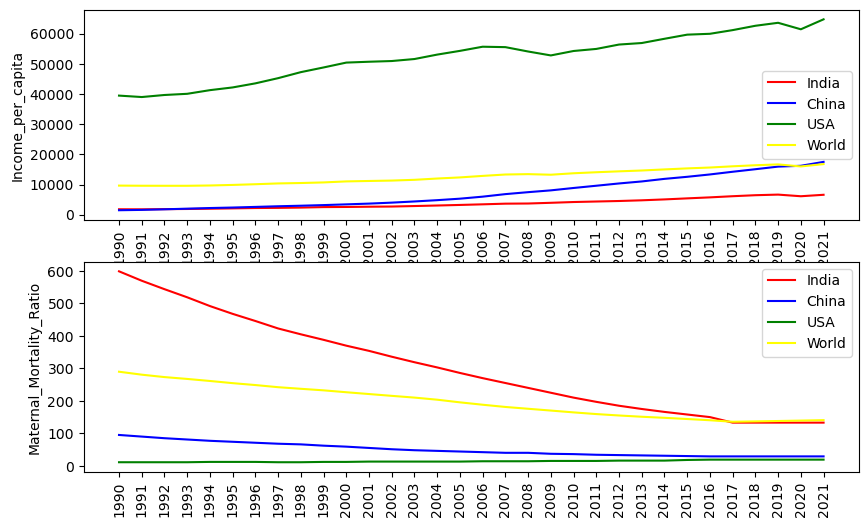

In [31]:
# Plot1
plt.figure(figsize=(10, 6))
ax1 = plt.subplot(211)  # 2 rows, 1 column, 1st subplot
ax1.plot(np.unique(year_col), Master_df[Master_df['Country'] == 'India']['Income_per_capita'].values, color='red')
ax1.plot(np.unique(year_col), Master_df[Master_df['Country'] == 'China']['Income_per_capita'].values, color='blue')
ax1.plot(np.unique(year_col), Master_df[Master_df['Country'] == 'United States']['Income_per_capita'].values, color='green')
ax1.plot(np.unique(year_col), Master_df[Master_df['Country'] == 'World']['Income_per_capita'].values, label='World',color = 'yellow')
ax1.set_ylabel('Income_per_capita') 
plt.xticks(rotation=90)
plt.legend(labels=['India', 'China', 'USA','World'])

# Plot2
ax2 = plt.subplot(212, sharex=ax1)  # 2 rows, 1 column, 2nd subplot sharing x-axis with the 1st subplot
ax2.plot(np.unique(year_col), Master_df[Master_df['Country'] == 'India']['Maternal_Mortality_Ratio'].values, color='red')
ax2.plot(np.unique(year_col), Master_df[Master_df['Country'] == 'China']['Maternal_Mortality_Ratio'].values, color='blue')
ax2.plot(np.unique(year_col), Master_df[Master_df['Country'] == 'United States']['Maternal_Mortality_Ratio'].values, color='green')
ax2.plot(np.unique(year_col), Master_df[Master_df['Country'] == 'World']['Maternal_Mortality_Ratio'].values, label='World',color = 'yellow')
ax2.set_ylabel('Maternal_Mortality_Ratio')
plt.xticks(rotation=90)
plt.legend(labels=['India', 'China', 'USA','World'])

plt.show()

**Observations:** When we look at the line for World, we can see that there does seem to be a correlation. A steady rise in income per capita is associated with considerable decline in maternal mortality rates. The effect is more pronounced for India and might also be extended to other developing countries.

Lets try to visualize the relation between Population_density and Unemployment_rates over time

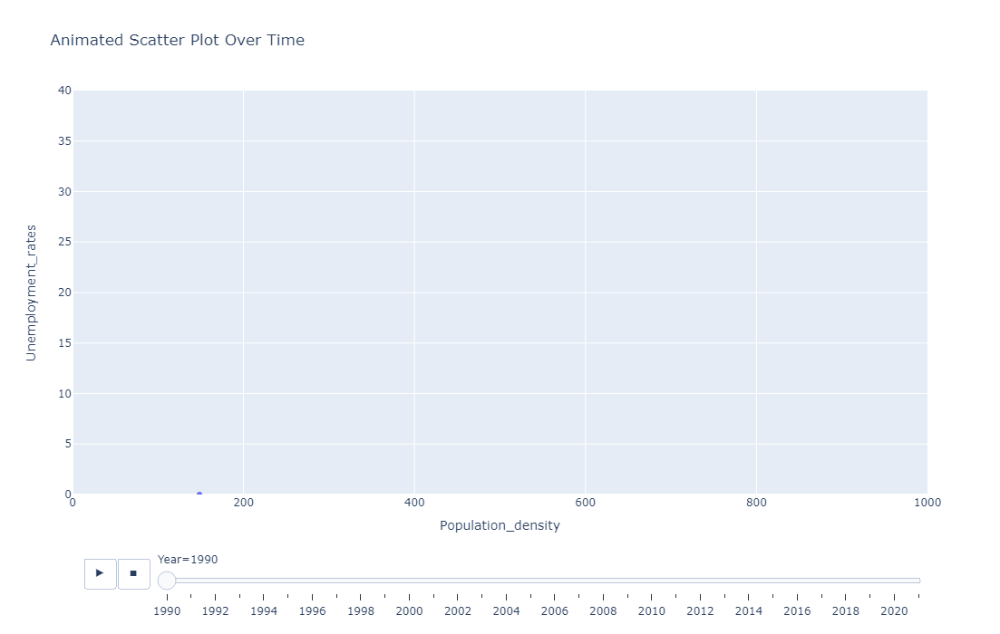

In [32]:

fig = px.scatter(
    Master_df, 
    x='Population_density', 
    y='Unemployment_rates', 
    animation_frame='Year', 
    title='Animated Scatter Plot Over Time', 
    range_x=[0, 1000],
    range_y=[0, 40],
    hover_name='Country',
    labels = Master_df['Country'].unique,
    width=700,
    height=700,
    
    size_max=60,)

fig.show()


**Observations:** There does seem to be a miniscule effect of population density on unemployment rates. Countries with higher population densities have lower unemployment rates and vice versa. The association is weak. This conclusion is also backed by the correlation coefficient for these 2 variables which is -0.09 or -9%. This effect can be attributed to the fact that for regions with higher population density, the it is easier for industries to get a reliable source of employees for their workforce, leading to higher employment in those regions.

In [33]:
Master_df.to_csv('Master_df.csv',index = False)

Now that we have created the dataset and tried some visuaization, we shall create a streamlit based web application where we can seamlessly interact with the data and get various kinds of insights from our dataset. This is how the app looks like.

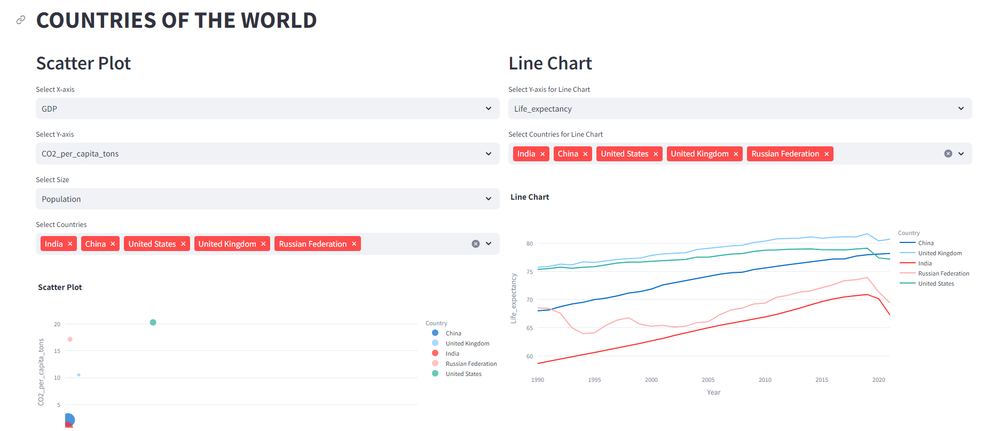

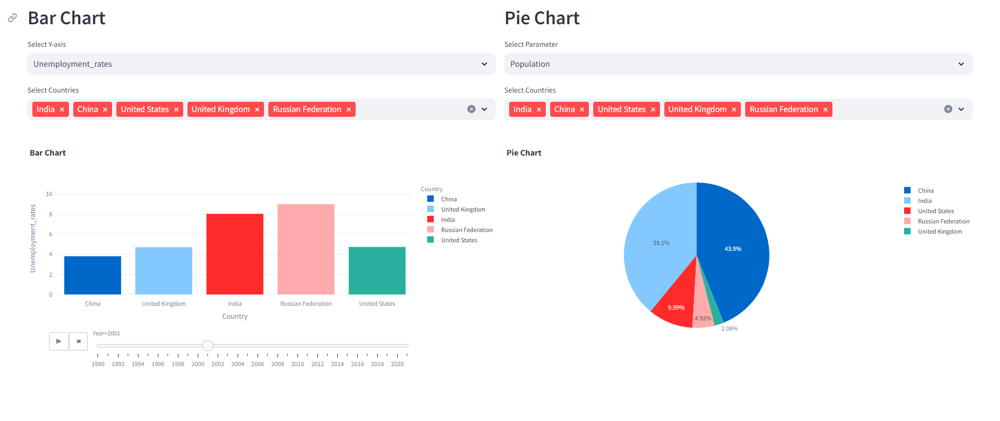

Follow the directions in the Readme file to use this application